# Pycaret time_series module

- available since pycaret 3.0.0 released March 18th 2023
- based on sktime

**Warning 1**

Mac is offically not supported. Before installing pycaret do

    brew install cmake
    
**Warning 2**  

pycaret 3.0.0 forgot to pin the version of sktime.
To make it work one has to install `sktime<0.18`
    
    pip install pycaret "sktime<0.18"

In [1]:
import pandas as pd
import pycaret.time_series as pyts

In [2]:
df = pd.read_csv("20230503_090829.csv")

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 394 entries, 0 to 393
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Time        394 non-null    object 
 1   MAX(count)  394 non-null    float64
dtypes: float64(1), object(1)
memory usage: 6.3+ KB


In [4]:
df.index = pd.to_datetime(df.Time)

In [5]:
df2 = df.drop("Time", axis=1)

In [6]:
df3 = df2.rename(columns={"MAX(count)": "timeoff"})

<Axes: xlabel='Time'>

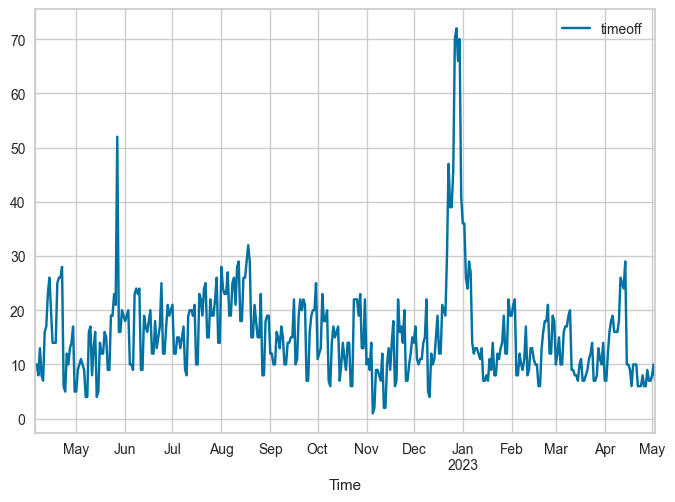

In [7]:
df3.plot()

## Object oriented interface

- new in pycaret 3.0  
- recommended by me

Instead of global imports

    from pycaret.time_series import *
    s = setup(df3, fh=30, session_id=42)
    
Better use

    import pycaret.timeseries as pyts
    exp = pyts.TSForecastingExperiment()
    exp.setup(df3, fh=30, session_id=42)

In [8]:
exp = pyts.TSForecastingExperiment()

In [9]:
exp.setup(df3, fh=30, session_id=42, seasonal_period=[7,30,31,365,366], max_sp_to_consider=400)

,Description,Value
0,session_id,42
1,Target,timeoff
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(394, 1)"
5,Transformed data shape,"(394, 1)"
6,Transformed train set shape,"(364, 1)"
7,Transformed test set shape,"(30, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


In [10]:
exp.check_stats()

,Test,Test Name,Data,Property,Setting,Value
0,Summary,Statistics,Transformed,Length,,394.0
1,Summary,Statistics,Transformed,# Missing Values,,0.0
2,Summary,Statistics,Transformed,Mean,,15.598985
3,Summary,Statistics,Transformed,Median,,14.0
4,Summary,Statistics,Transformed,Standard Deviation,,9.059408
5,Summary,Statistics,Transformed,Variance,,82.072874
6,Summary,Statistics,Transformed,Kurtosis,,12.447098
7,Summary,Statistics,Transformed,Skewness,,2.690653
8,Summary,Statistics,Transformed,# Distinct Values,,39.0
9,White Noise,Ljung-Box,Transformed,Test Statictic,"{'alpha': 0.05, 'K': 24}",898.583563


## What does all this mean

- See documentation sktime <https://www.sktime.net/en/latest/api_reference/param_est.html>
- Sktime refers to statsmodel <https://www.statsmodels.org/stable/tsa.html#descriptive-statistics-and-tests>
- statsmodel results have been verified with at least one other statistical package: R, Stata or SAS.

In [11]:
best = exp.compare_models()

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
dt_cds_dt,Decision Tree w/ Cond. Deseasonalize & Detrending,0.7840,0.5818,4.6563,5.6513,0.4271,0.3493,-0.5516,0.0933
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,0.7851,0.5651,4.6759,5.5123,0.4511,0.3406,-0.5596,0.1100
xgboost_cds_dt,Extreme Gradient Boosting w/ Cond. Deseasonalize & Detrending,0.8564,0.6094,5.1303,5.9715,0.4938,0.3701,-0.9327,0.1133
huber_cds_dt,Huber w/ Cond. Deseasonalize & Detrending,0.8584,0.6283,5.1065,6.1222,0.4944,0.3682,-0.8949,0.1400
grand_means,Grand Means Forecaster,0.9570,0.6527,5.6907,6.3576,0.5903,0.4209,-1.0972,0.4233
knn_cds_dt,K Neighbors w/ Cond. Deseasonalize & Detrending,0.9905,0.7135,5.8843,6.9445,0.5715,0.4053,-1.3989,0.1167
et_cds_dt,Extra Trees w/ Cond. Deseasonalize & Detrending,0.9937,0.7140,5.8995,6.9412,0.5782,0.4078,-1.3476,0.1767
catboost_cds_dt,CatBoost Regressor w/ Cond. Deseasonalize & Detrending,1.0142,0.7218,6.0176,7.0189,0.5917,0.4149,-1.4032,0.5333
llar_cds_dt,Lasso Least Angular Regressor w/ Cond. Deseasonalize & Detrending,1.0349,0.7368,6.1565,7.1753,0.5896,0.4324,-1.5957,0.0933
lasso_cds_dt,Lasso w/ Cond. Deseasonalize & Detrending,1.0350,0.7368,6.1570,7.1758,0.5896,0.4325,-1.5959,0.0933


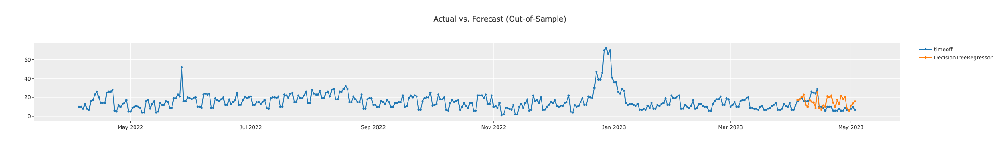

In [39]:
# plot forecast
exp.plot_model(best, plot = 'forecast')

In [13]:
# residuals plot
exp.plot_model(best, plot = 'residuals')

In sample predictions has not been implemented for this estimator of type 'BaseCdsDtForecaster' in `sktime`. When this is implemented, it will be enabled by default in pycaret.
In sample predictions has not been implemented for this estimator of type 'BaseCdsDtForecaster' in `sktime`. When this is implemented, it will be enabled by default in pycaret.


In [22]:
top5 = exp.compare_models(n_select = 5)

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
dt_cds_dt,Decision Tree w/ Cond. Deseasonalize & Detrending,0.7840,0.5818,4.6563,5.6513,0.4271,0.3493,-0.5516,0.0967
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,0.7851,0.5651,4.6759,5.5123,0.4511,0.3406,-0.5596,0.1133
xgboost_cds_dt,Extreme Gradient Boosting w/ Cond. Deseasonalize & Detrending,0.8564,0.6094,5.1303,5.9715,0.4938,0.3701,-0.9327,0.1133
huber_cds_dt,Huber w/ Cond. Deseasonalize & Detrending,0.8584,0.6283,5.1065,6.1222,0.4944,0.3682,-0.8949,0.0933
grand_means,Grand Means Forecaster,0.9570,0.6527,5.6907,6.3576,0.5903,0.4209,-1.0972,0.4333
knn_cds_dt,K Neighbors w/ Cond. Deseasonalize & Detrending,0.9905,0.7135,5.8843,6.9445,0.5715,0.4053,-1.3989,0.1167
et_cds_dt,Extra Trees w/ Cond. Deseasonalize & Detrending,0.9937,0.7140,5.8995,6.9412,0.5782,0.4078,-1.3476,0.1833
catboost_cds_dt,CatBoost Regressor w/ Cond. Deseasonalize & Detrending,1.0142,0.7218,6.0176,7.0189,0.5917,0.4149,-1.4032,0.5333
llar_cds_dt,Lasso Least Angular Regressor w/ Cond. Deseasonalize & Detrending,1.0349,0.7368,6.1565,7.1753,0.5896,0.4324,-1.5957,0.1233
lasso_cds_dt,Lasso w/ Cond. Deseasonalize & Detrending,1.0350,0.7368,6.1570,7.1758,0.5896,0.4325,-1.5959,0.1000


# The metrics

- MAE = Mean Absolute Error
- RMSE = Root Mean Squared Error
- MAPE = Mean Absolute Percentage Error (beware of `0`s)
- SMAPE = Symmetric MAPE 
- MASE = Mean Absolute Scaled Error (= MAE/MAE_naive_forecast)
- RMSSE = Root Mean Squared Scaled Error ( = ROOT(MSE/MSE_naive_forecast) )

In [23]:
top5

[BaseCdsDtForecaster(fe_target_rr=[WindowSummarizer(lag_feature={'lag': [7, 6, 5,
                                                                         4, 3, 2,
                                                                         1]},
                                                    n_jobs=1)],
                     regressor=DecisionTreeRegressor(random_state=42), sp=7,
                     window_length=7),
 BaseCdsDtForecaster(fe_target_rr=[WindowSummarizer(lag_feature={'lag': [7, 6, 5,
                                                                         4, 3, 2,
                                                                         1]},
                                                    n_jobs=1)],
                     regressor=GradientBoostingRegressor(random_state=42), sp=7,
                     window_length=7),
 BaseCdsDtForecaster(fe_target_rr=[WindowSummarizer(lag_feature={'lag': [7, 6, 5,
                                                                      

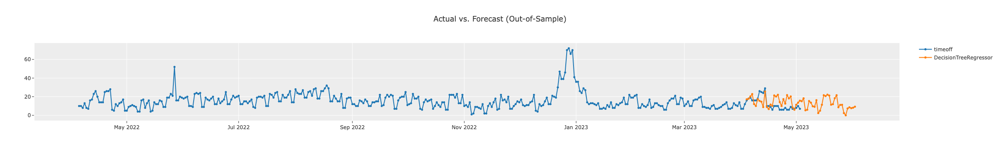

In [40]:
exp.plot_model(top5[0], plot = 'forecast', data_kwargs = {'fh' : 60})

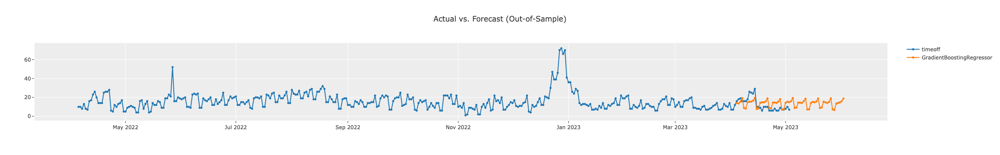

In [29]:
exp.plot_model(top5[1], plot = 'forecast', data_kwargs = {'fh' : 60})

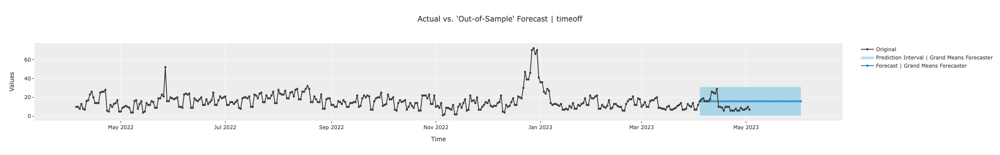

In [32]:
exp.plot_model(top5[4], plot = 'forecast', data_kwargs = {'fh' : 60})

Grand Means forecaster is NaiveForecaster of sktime with strategy mean: Forecasts the mean of the time series.

In [34]:
exp.plot_model(top5[0], plot = 'diagnostics', fig_kwargs={"width" : 1500, "height" : 1000})

In sample predictions has not been implemented for this estimator of type 'BaseCdsDtForecaster' in `sktime`. When this is implemented, it will be enabled by default in pycaret.
In sample predictions has not been implemented for this estimator of type 'BaseCdsDtForecaster' in `sktime`. When this is implemented, it will be enabled by default in pycaret.


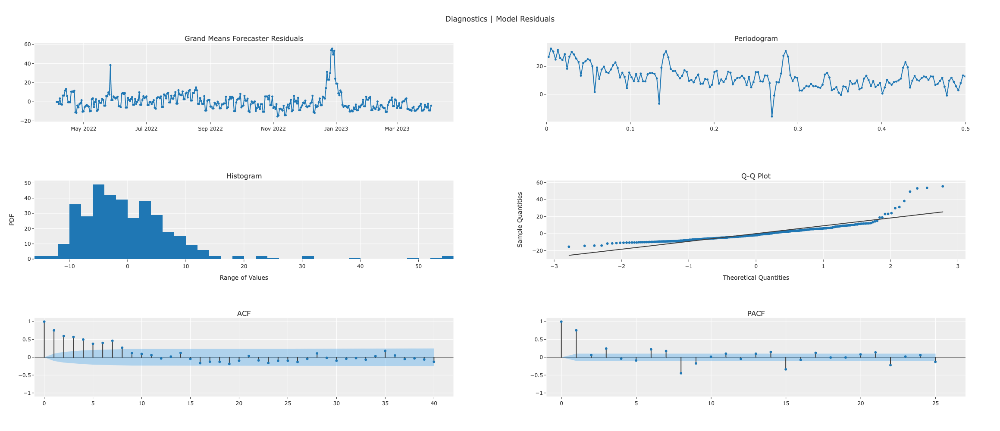

In [41]:
exp.plot_model(top5[4], plot = 'diagnostics', fig_kwargs={"width" : 1500, "height" : 1000})

## Summary

- Beware of the dependency bugs
- Very quick for univariate time series
- For multivariate time series look at sktime : <https://github.com/sktime/sktime/blob/main/examples/01_forecasting.ipynb>
- For more sophisticated models look at pytorch_forecasting and darts